# ***``T-Distributed Stochastic Neighbor Embedding``***

---

## 1. [Understanding PCA using dummy dataset](#Understanding_PCA)
- #### [Data Normalization](#STEP-1)
- #### [COV Symmetric Matrix](#STEP-2)

## 2. [Ways of calculating Eigen Values & Vectors](#Calculating_Eigen_values_and_vectors)
- #### [Using Numpy Linear Alzebra](#1._Numpy_Linear_Alzebra)
- #### [Using Scipy Linear Alzebra](#2._Scipy_Linear_Alzebra)
- #### [Using Sklearn PCA](#3._Sklearn_PCA)
- #### [Using Scipy SVD](#4._Scipy_SVD)
    
## 3. [PCA on Iris Dataset](#PCA_on_IRIS_Dataset)

## 4. [Ways of generating Symmetric_Matrix](#Ways_of_generating_Symmetric_Matrix)

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import load_breast_cancer as bc, load_iris as l_iris
from sklearn.preprocessing import StandardScaler as SS
from sklearn.manifold import TSNE

%matplotlib inline

In [25]:
cancer = bc()                                  ## Instantiating Breast Cancer Dataset object
iris = l_iris()                                ## Instantiating IRIS Datset object
ss = SS()                                      ## Instantiating Standard Scaler
tsne = TSNE(n_components=2, random_state=41)   ## Instantiating TSNE

In [87]:
cancer_df = pd.concat([pd.DataFrame(cancer.data,columns=cancer.feature_names),pd.DataFrame(cancer.target,columns=['target'])],axis=1)
cancer_norm_df = pd.DataFrame(ss.fit_transform(cancer_df.iloc[:,0:-1]),columns=cancer.feature_names)
cancer_norm_df.head(10)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [27]:
cancer_df['target'].value_counts()

1    357
0    212
Name: target, dtype: int64

# ***`t-SNE on boundary values`***
- ### ***`Lowest boundary value of Perplexity as 1 on different Iterations`***

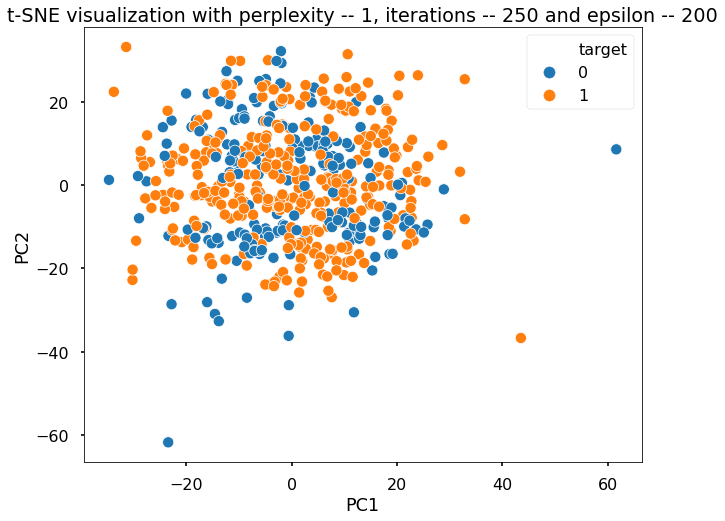

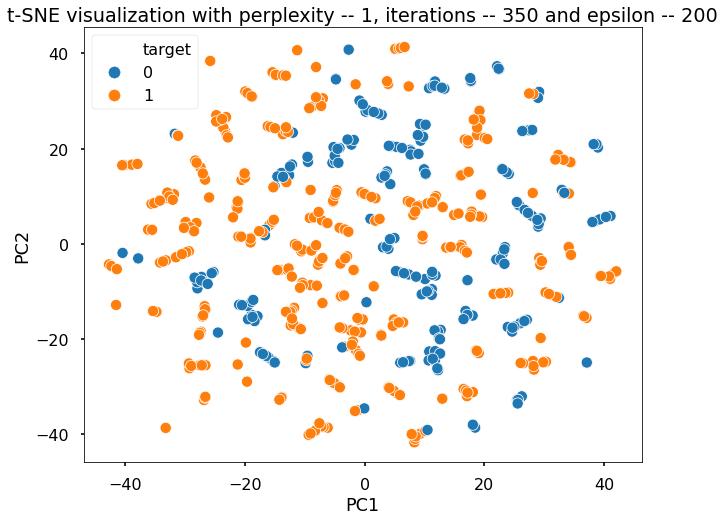

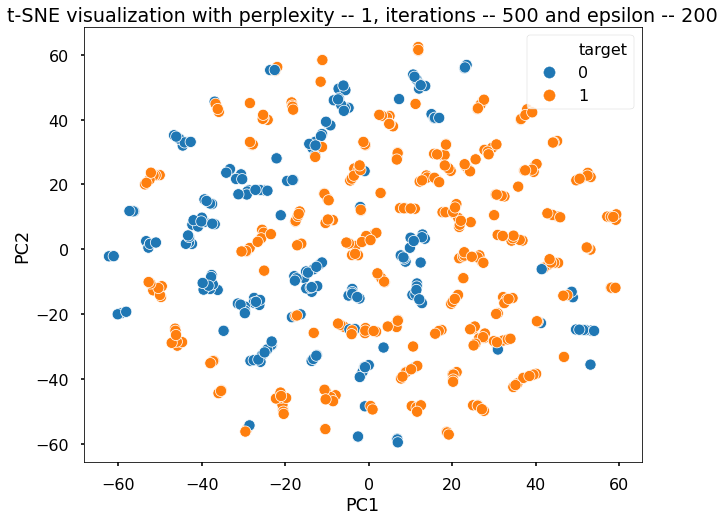

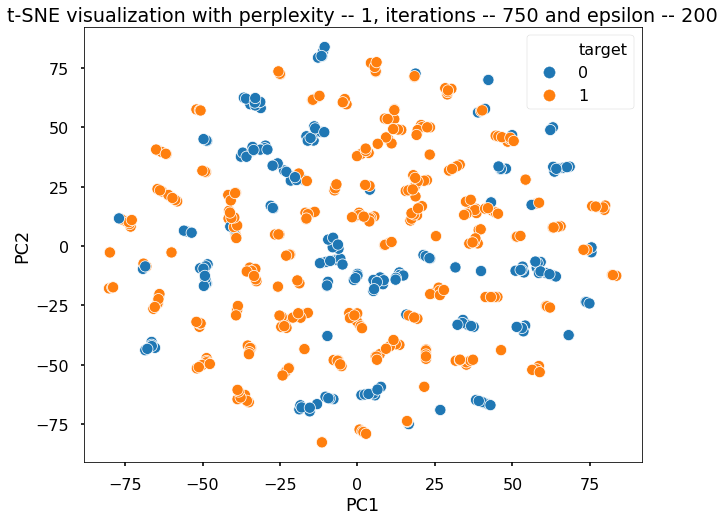

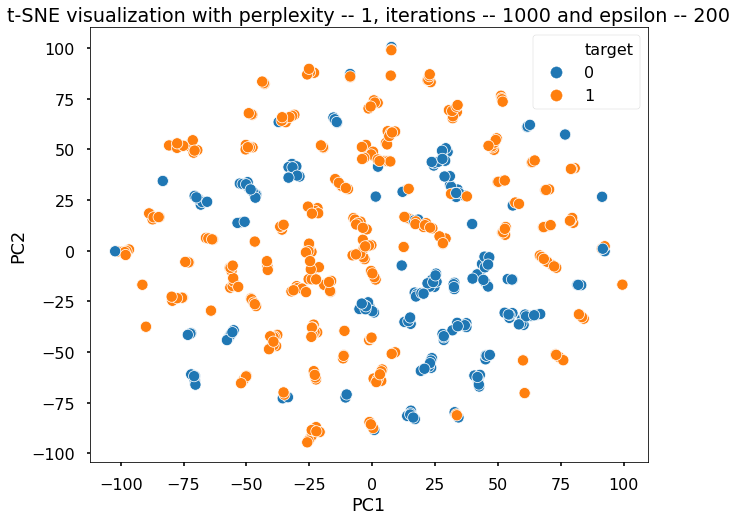

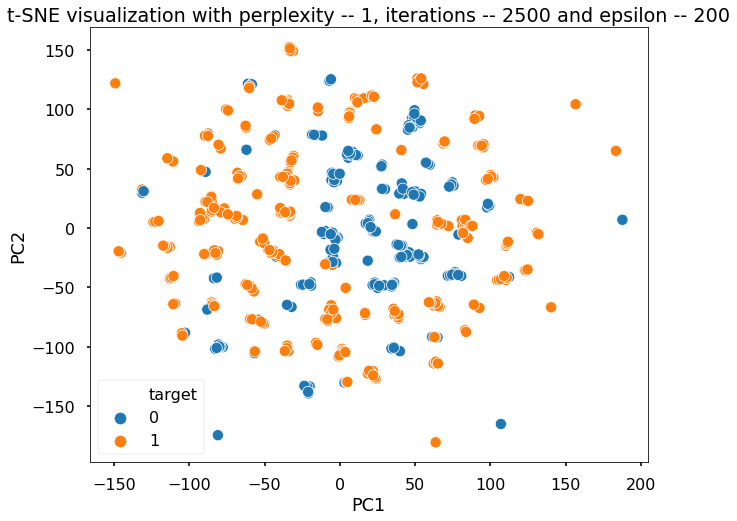

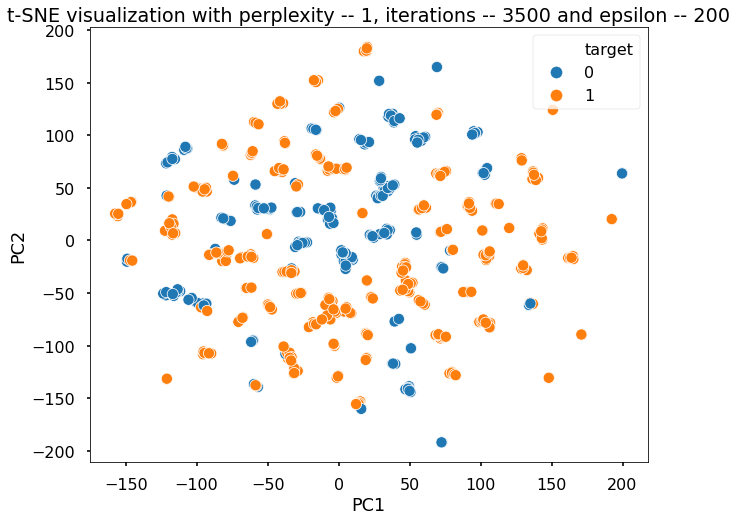

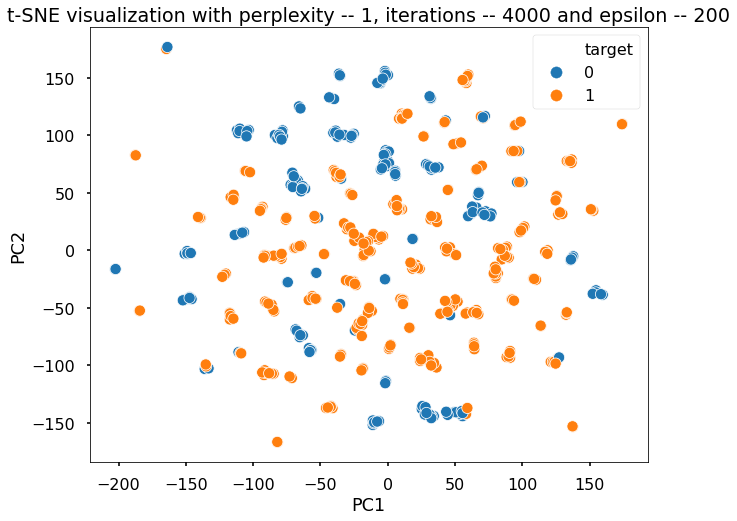

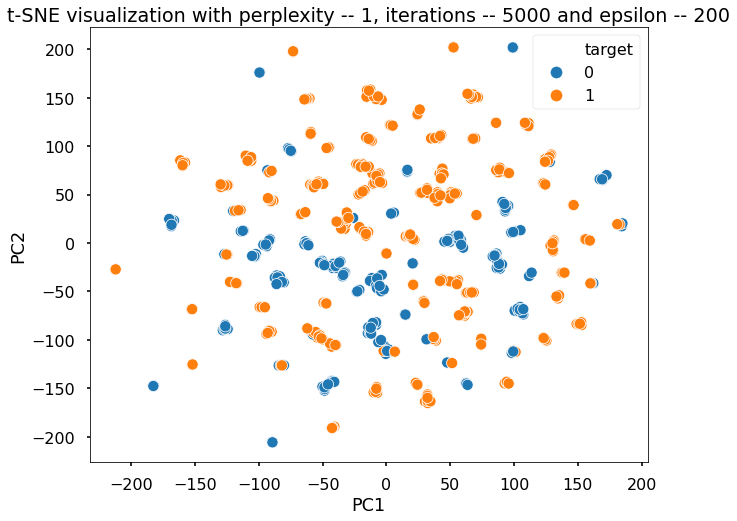

In [83]:
iterations = [250,350,500,750,1000,2500,3500,4000,5000]

for idx in range(len(iterations)):
    tsne1 = TSNE(n_components=2,perplexity=1,learning_rate=200,n_iter=iterations[idx])
    cancer_tsne_pcmps = pd.DataFrame(tsne1.fit_transform(cancer_norm_df),columns=['PC1','PC2'])
    cancer_tsne_pcmps = pd.concat([cancer_tsne_pcmps,cancer_df['target']],axis=1)
    with plt.style.context('seaborn-poster'):
        plt.figure(figsize=(7,7))
        sns.scatterplot(data=cancer_tsne_pcmps,x='PC1',y='PC2',hue='target')
        plt.title("t-SNE visualization with perplexity -- {0}, iterations -- {1} and epsilon -- {2}".format(tsne1.perplexity,
                                                                                                            tsne1.n_iter,
                                                                                                            tsne1.learning_rate))
        plt.show()

- ### ***`Highest boundary value of Perplexity as 569(number of data points) on different Iterations`***

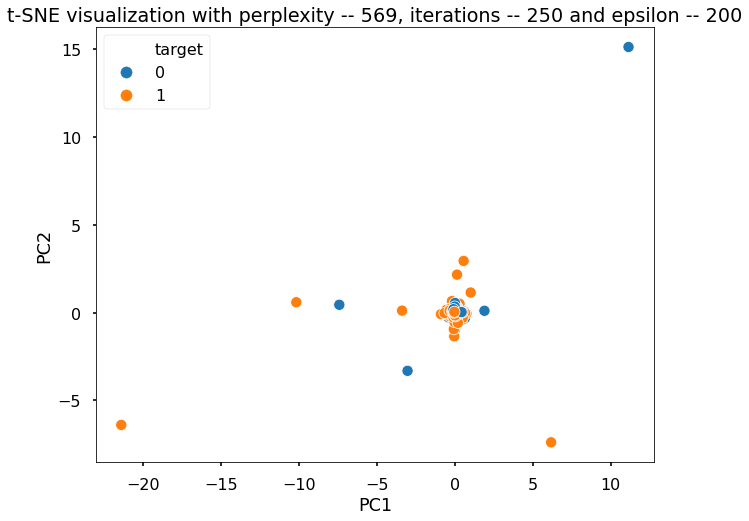

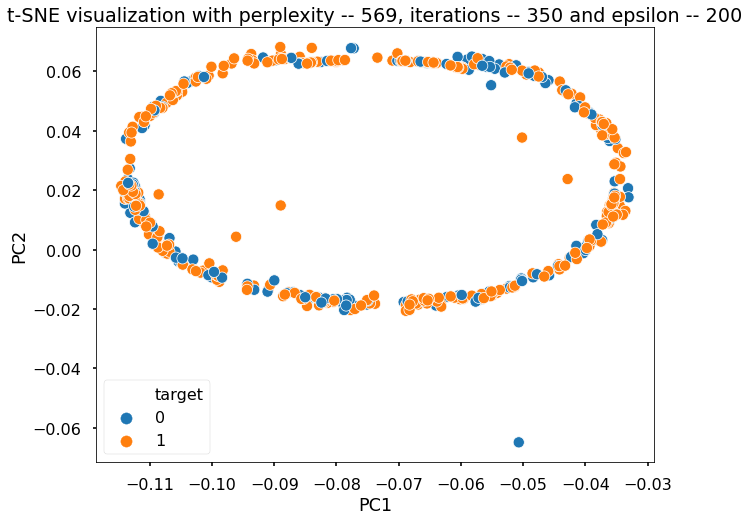

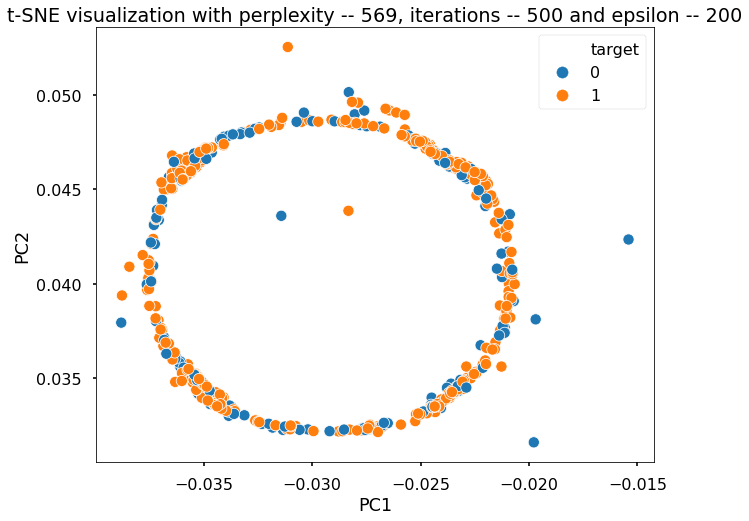

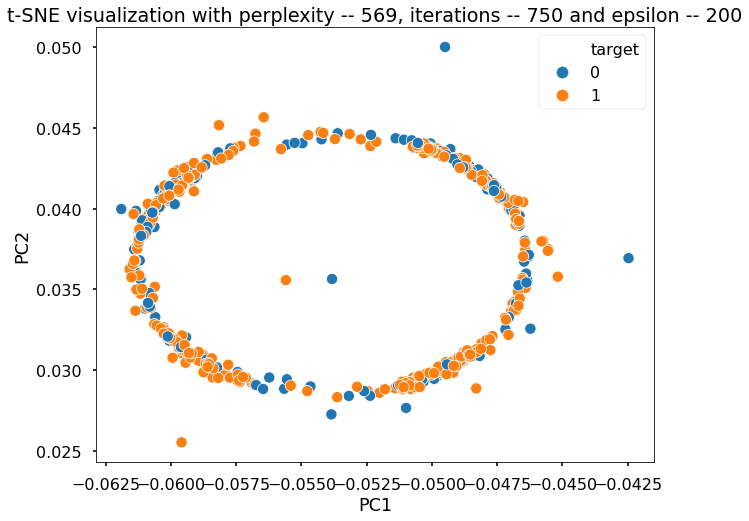

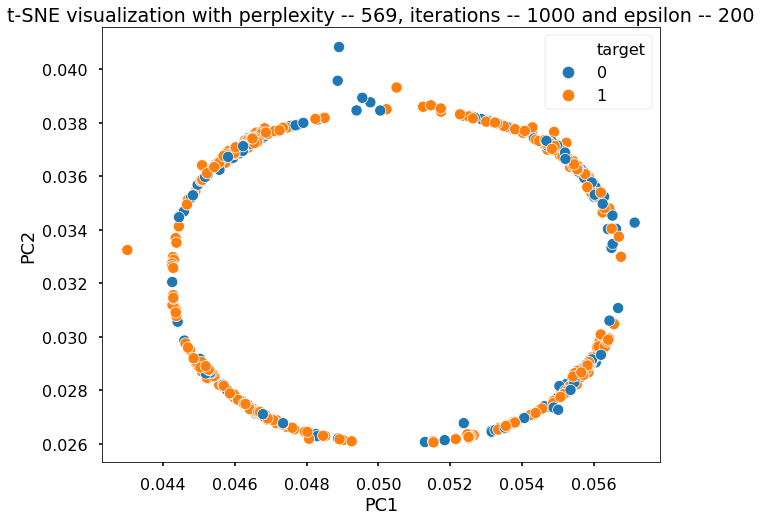

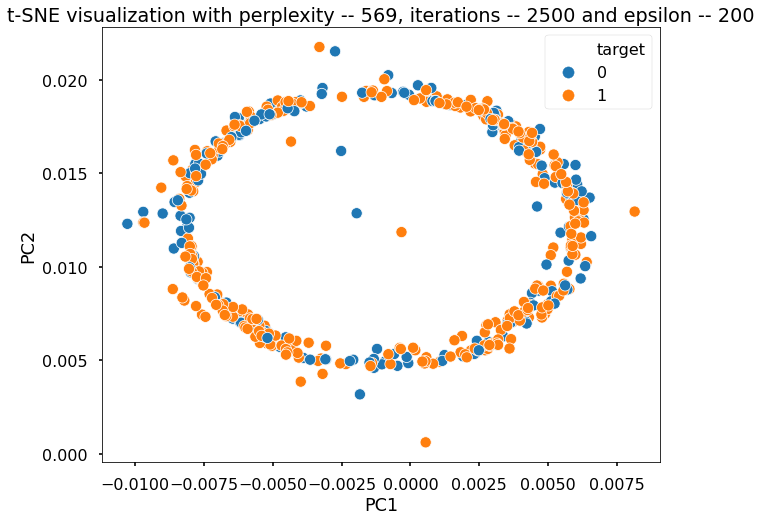

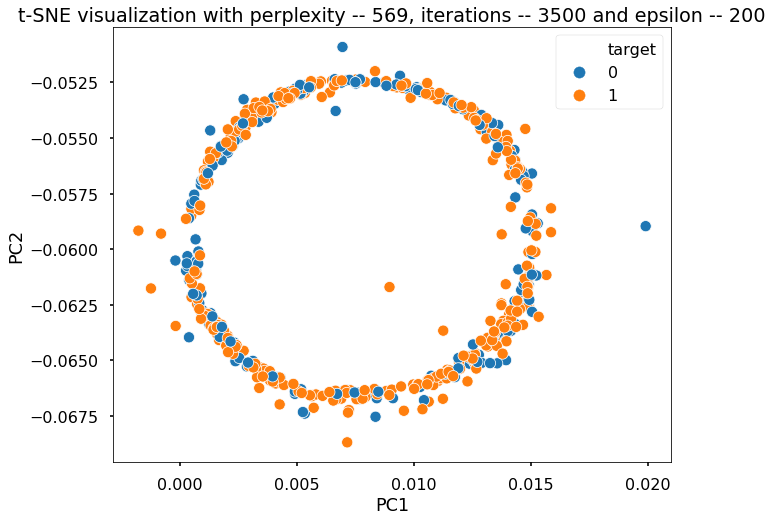

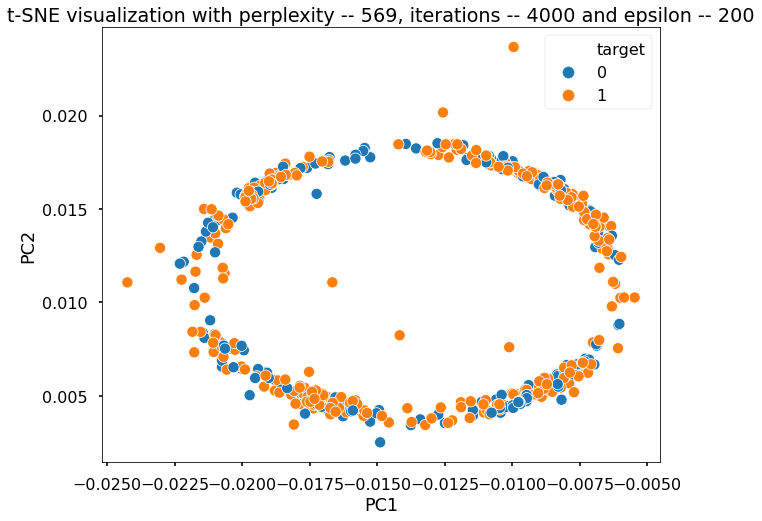

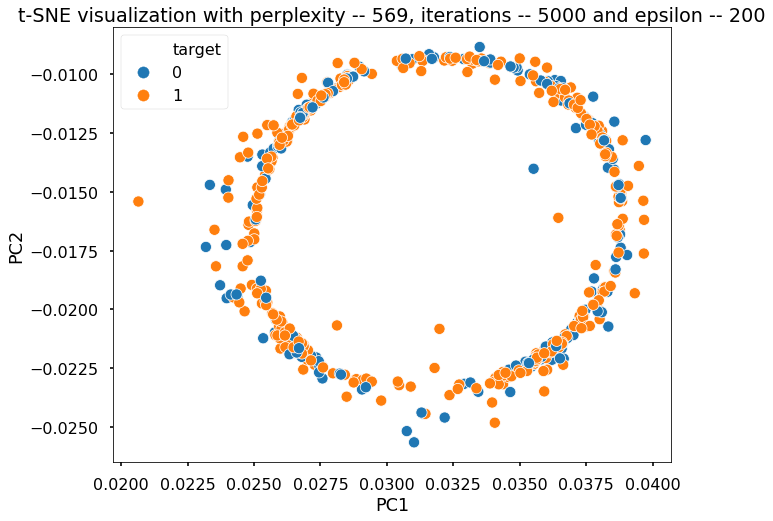

In [84]:
iterations = [250,350,500,750,1000,2500,3500,4000,5000]

for idx in range(len(iterations)):
    tsne1 = TSNE(n_components=2,perplexity=569,learning_rate=200,n_iter=iterations[idx])
    cancer_tsne_pcmps = pd.DataFrame(tsne1.fit_transform(cancer_norm_df),columns=['PC1','PC2'])
    cancer_tsne_pcmps = pd.concat([cancer_tsne_pcmps,cancer_df['target']],axis=1)
    with plt.style.context('seaborn-poster'):
        plt.figure(figsize=(10,8))
        sns.scatterplot(data=cancer_tsne_pcmps,x='PC1',y='PC2',hue='target')
        plt.title("t-SNE visualization with perplexity -- {0}, iterations -- {1} and epsilon -- {2}".format(tsne1.perplexity,
                                                                                                            tsne1.n_iter,
                                                                                                            tsne1.learning_rate))
        plt.show()

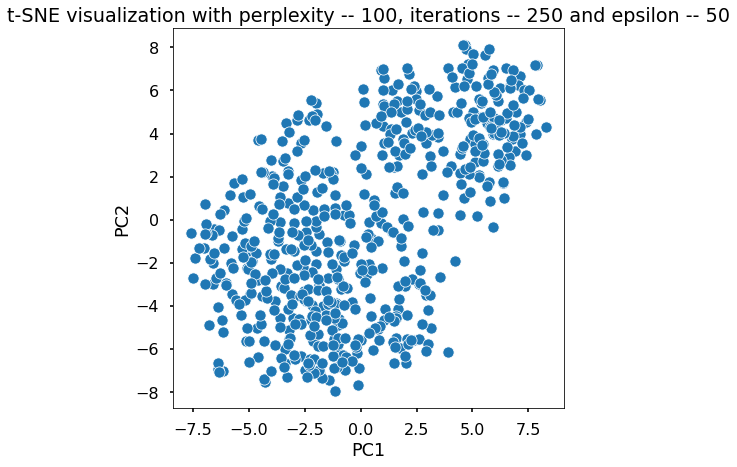

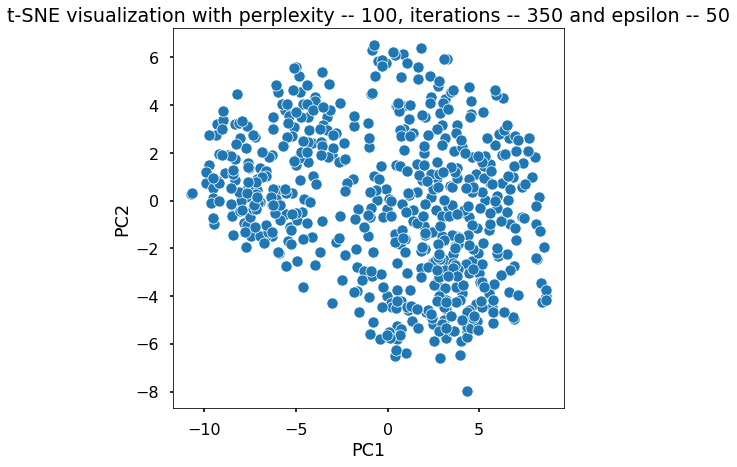

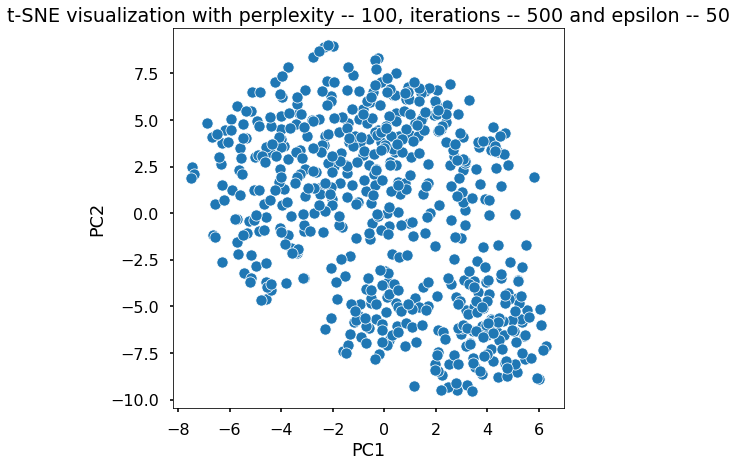

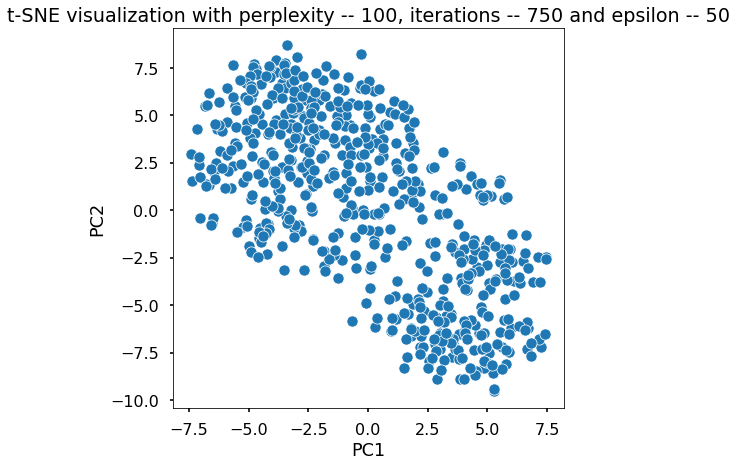

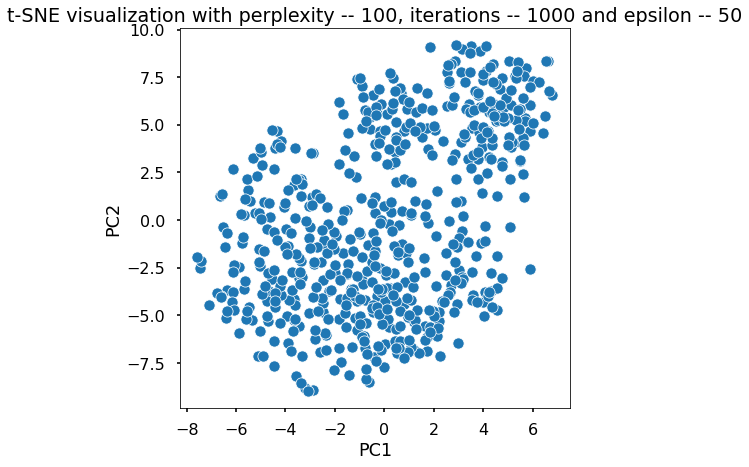

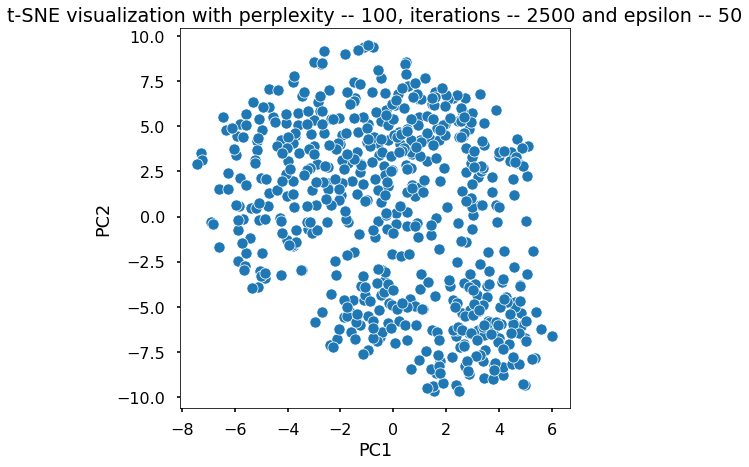

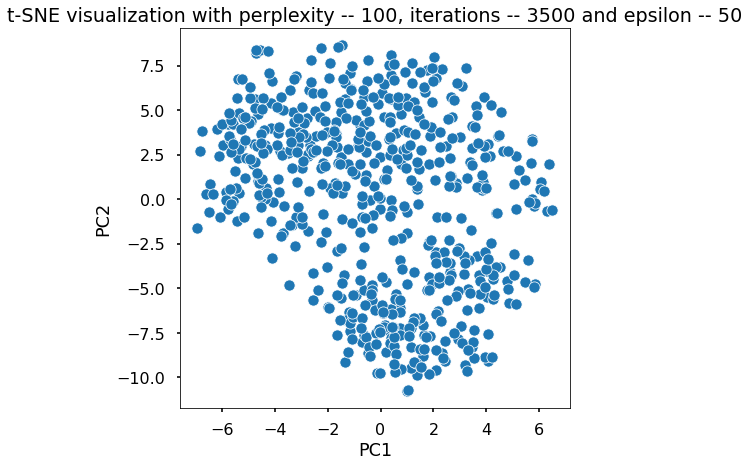

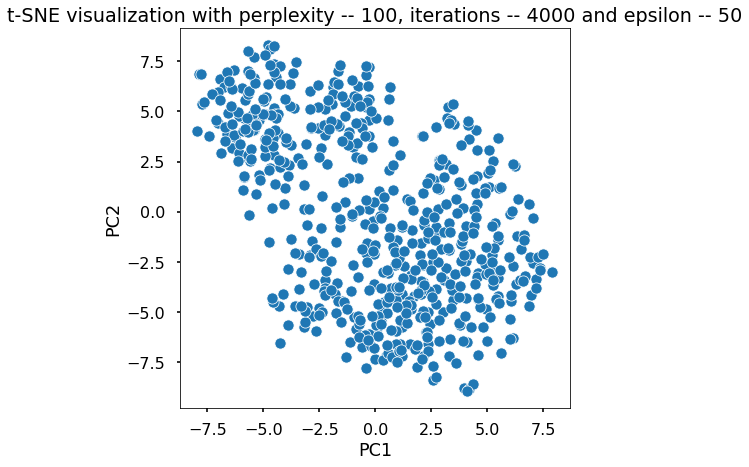

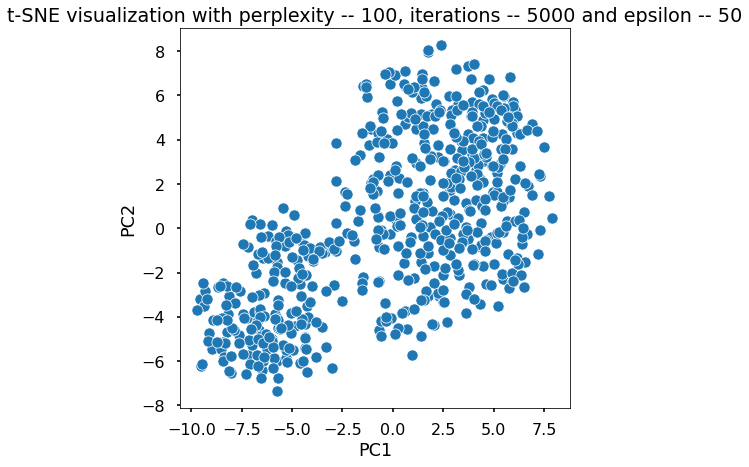

In [88]:
for idx in range(len(iterations)):
    tsne1 = TSNE(n_components=2,init='random',perplexity=100,learning_rate=50,n_iter=iterations[idx])
    cancer_tsne_pcmps = pd.DataFrame(tsne1.fit_transform(cancer_norm_df),columns=['PC1','PC2'])
    cancer_tsne_pcmps = pd.concat([cancer_tsne_pcmps,cancer_df['target']],axis=1)
    with plt.style.context('seaborn-poster'):
        plt.figure(figsize=(7,7))
        sns.scatterplot(data=cancer_tsne_pcmps,x='PC1',y='PC2')
        plt.title("t-SNE visualization with perplexity -- {0}, iterations -- {1} and epsilon -- {2}".format(tsne1.perplexity,
                                                                                                            tsne1.n_iter,
                                                                                                            tsne1.learning_rate))
        plt.show()

### ***`Running t-SNE on a range of perplexities and iterations with learning rate as 200 and lower dimension method as 'random'`***

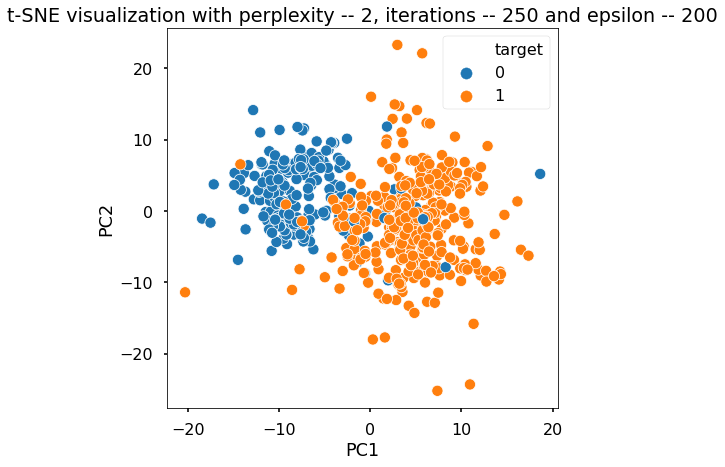

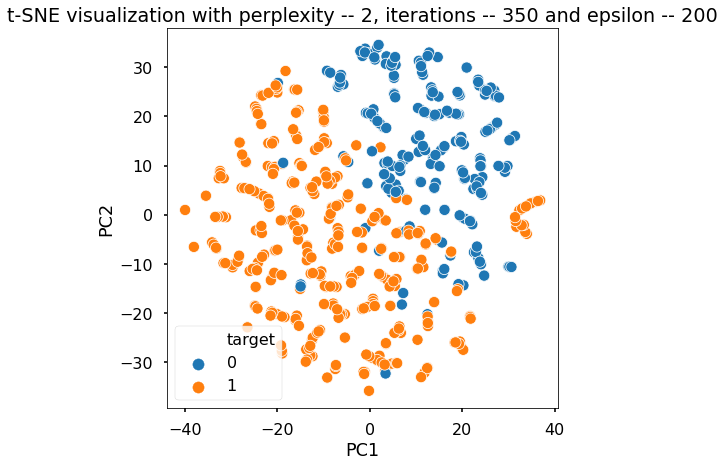

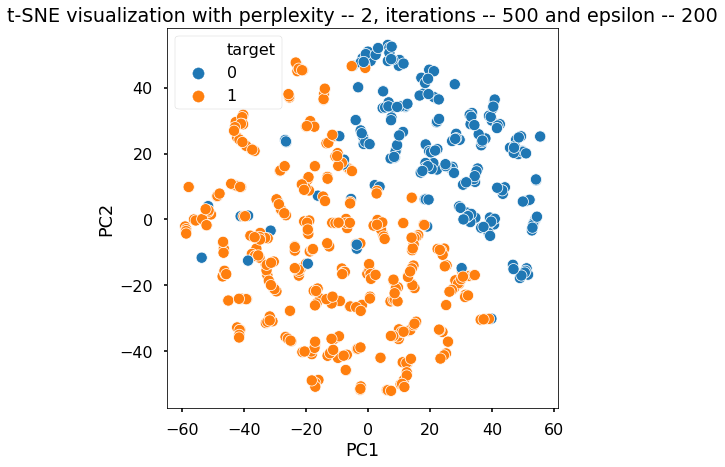

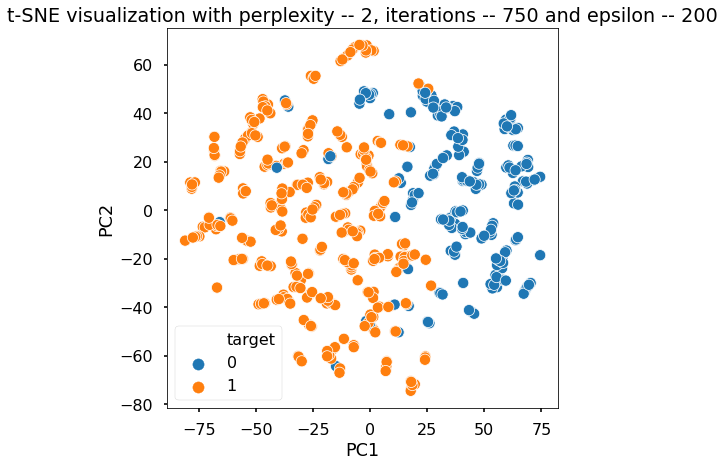

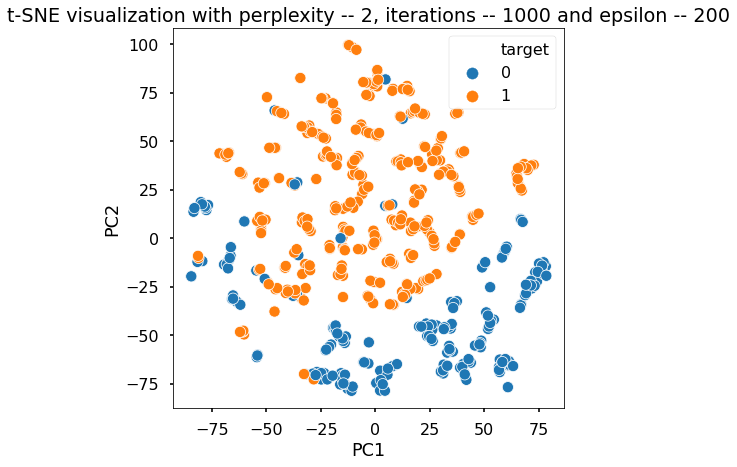

...

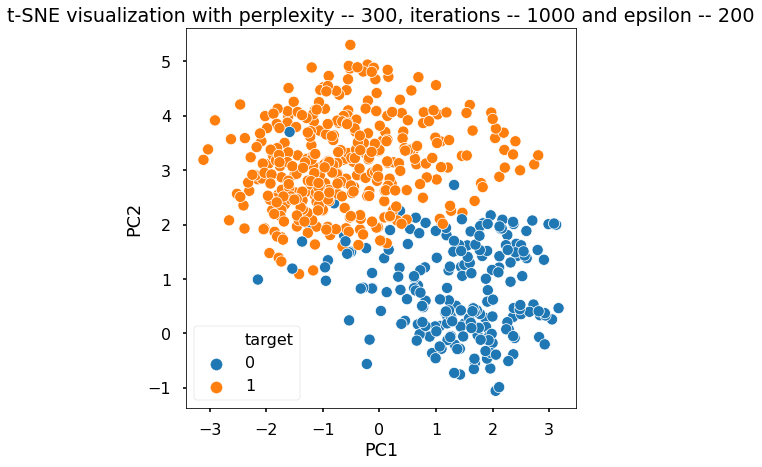

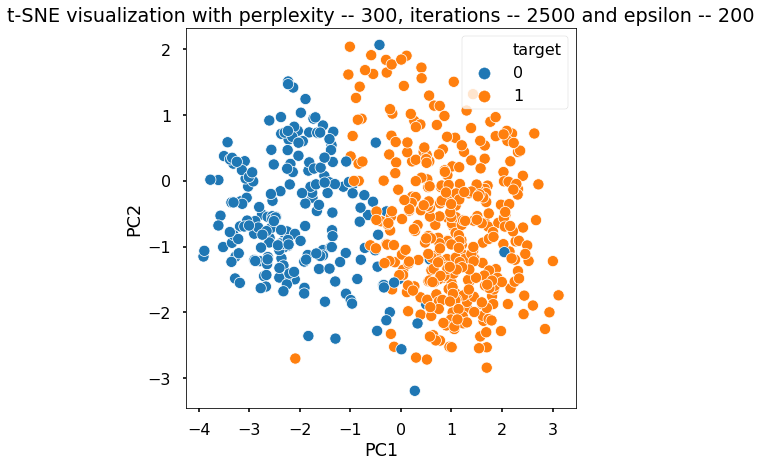

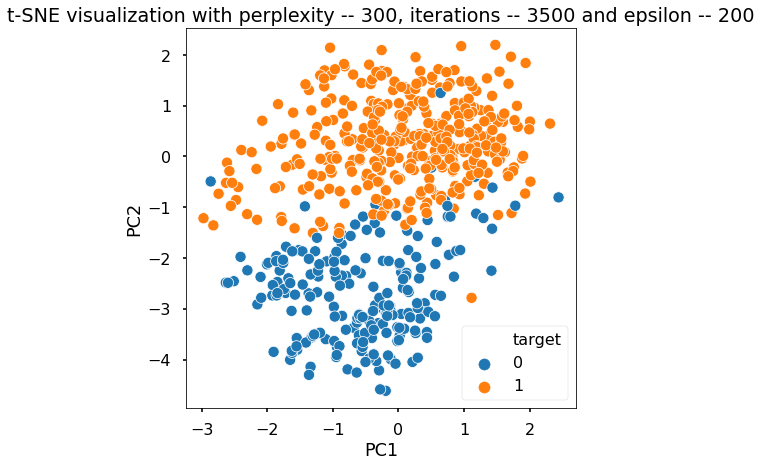

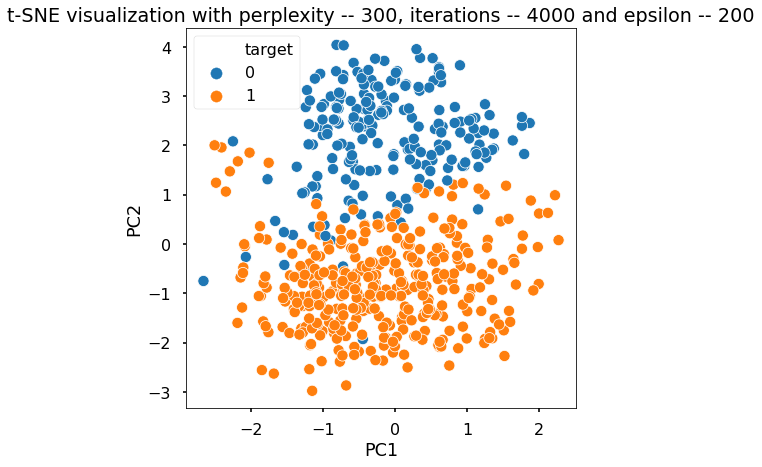

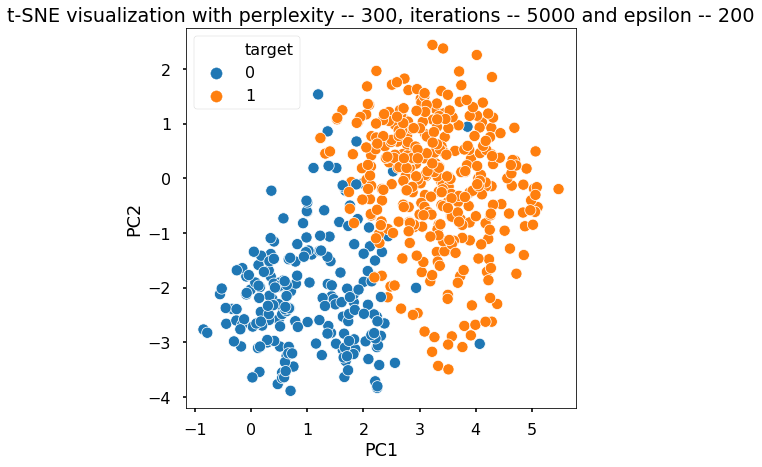

In [85]:
perplexities = [2,5,30,50,100,200,300]
iterations = [250,350,500,750,1000,2500,3500,4000,5000]

for pidx in range(len(perplexities)):
    for idx in range(len(iterations)):
        tsne1 = TSNE(n_components=2,init='random',perplexity=perplexities[pidx],learning_rate=200,n_iter=iterations[idx])
        cancer_tsne_pcmps = pd.DataFrame(tsne1.fit_transform(cancer_norm_df),columns=['PC1','PC2'])
        cancer_tsne_pcmps = pd.concat([cancer_tsne_pcmps,cancer_df['target']],axis=1)
        with plt.style.context('seaborn-poster'):
            plt.figure(figsize=(7,7))
            sns.scatterplot(data=cancer_tsne_pcmps,x='PC1',y='PC2',hue='target')
            plt.title("t-SNE visualization with perplexity -- {0}, iterations -- {1} and epsilon -- {2}".format(tsne1.perplexity,
                                                                                                            tsne1.n_iter,
                                                                                                            tsne1.learning_rate))
            plt.show()

### **In the above plots I observed that:**
- **Perplexity-100**
- **Iterations-5000 and,**
- **Epsilon-200**

#### **Gives me the better separation of classes and a few errors if go ahead with a linear model.**

### ***`Running t-SNE on a range of perplexities and iterations with learning rate as 200 and lower dimension method as 'PCA'`***

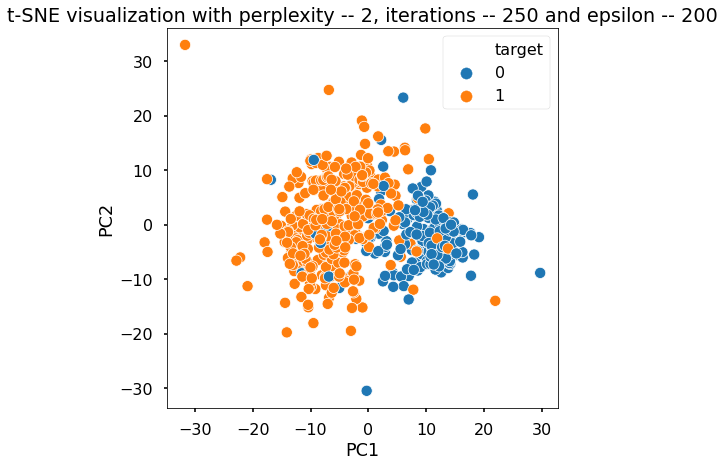

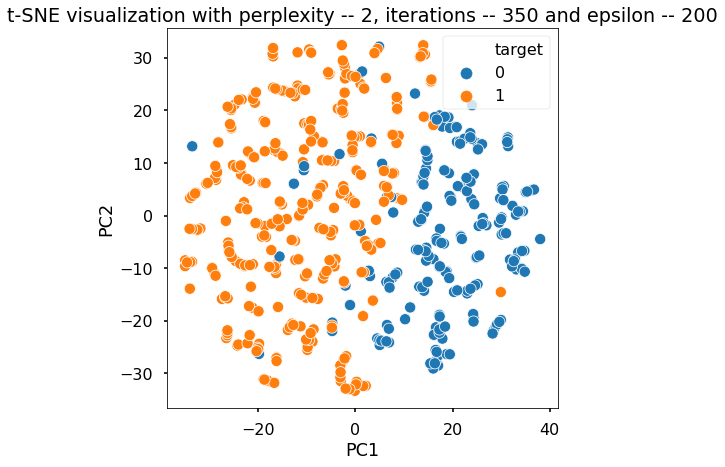

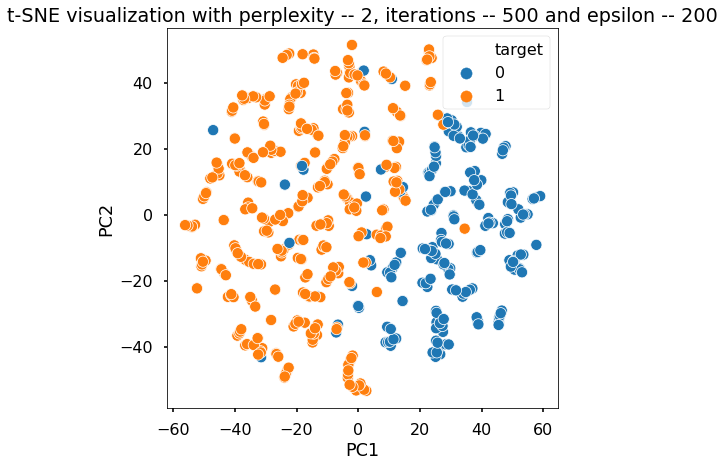

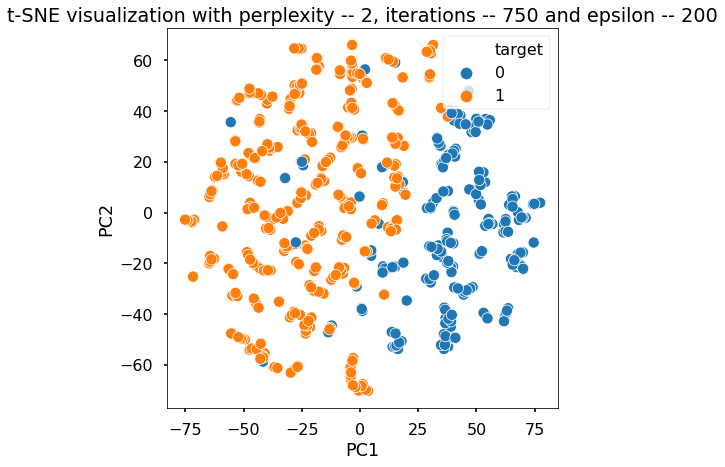

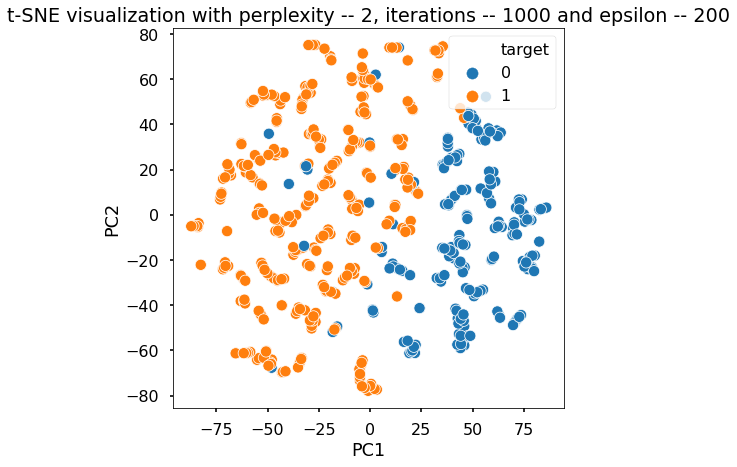

...

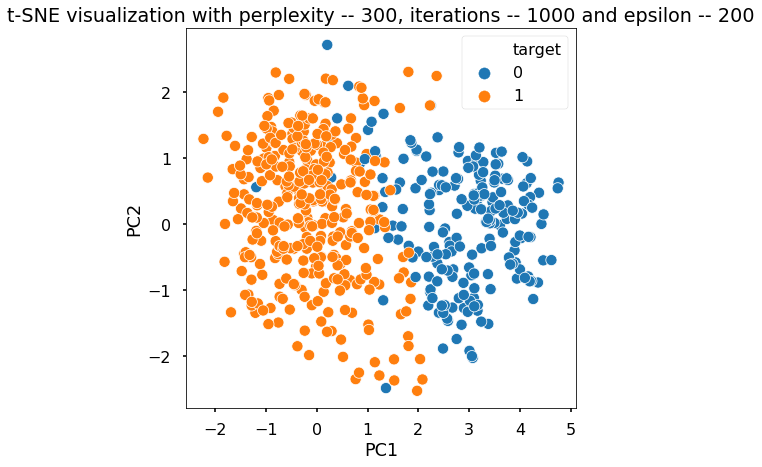

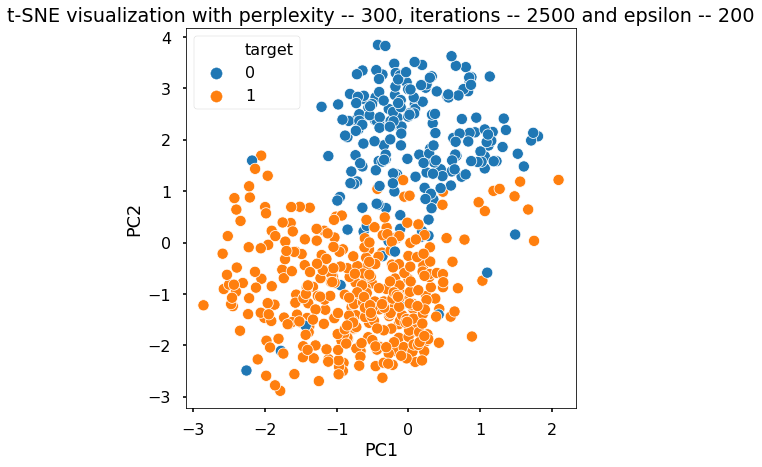

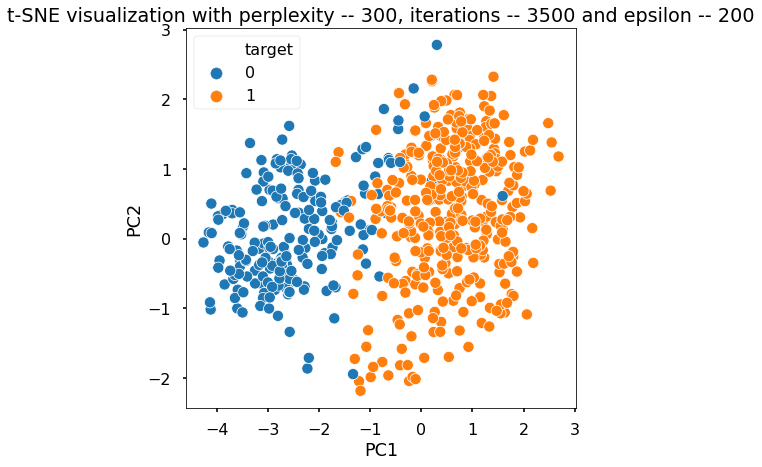

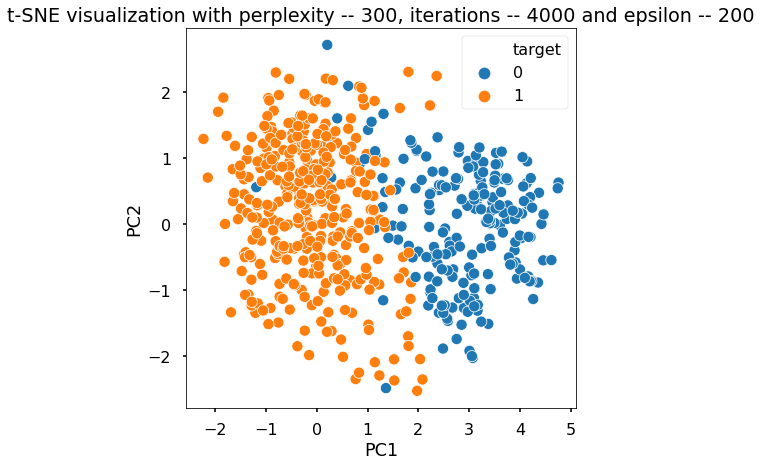

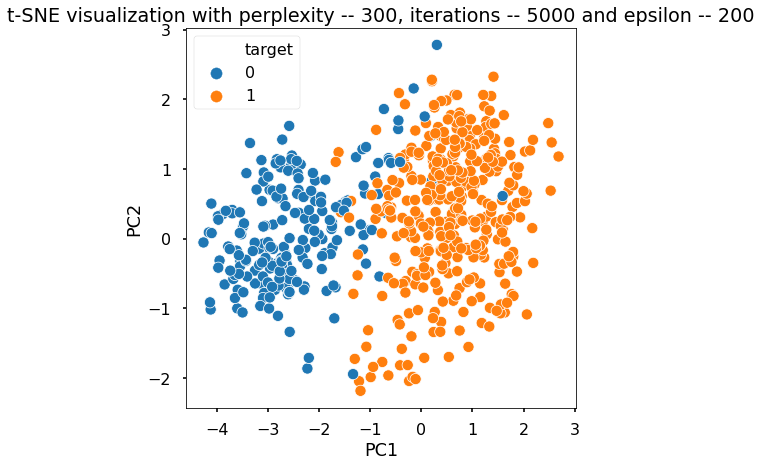

In [86]:
perplexities = [2,5,30,50,100,200,300]
iterations = [250,350,500,750,1000,2500,3500,4000,5000]

for pidx in range(len(perplexities)):
    for idx in range(len(iterations)):
        tsne1 = TSNE(n_components=2,init='pca',perplexity=perplexities[pidx],learning_rate=200,n_iter=iterations[idx])
        cancer_tsne_pcmps = pd.DataFrame(tsne1.fit_transform(cancer_norm_df),columns=['PC1','PC2'])
        cancer_tsne_pcmps = pd.concat([cancer_tsne_pcmps,cancer_df['target']],axis=1)
        with plt.style.context('seaborn-poster'):
            plt.figure(figsize=(7,7))
            sns.scatterplot(data=cancer_tsne_pcmps,x='PC1',y='PC2',hue='target')
            plt.title("t-SNE visualization with perplexity -- {0}, iterations -- {1} and epsilon -- {2}".format(tsne1.perplexity,
                                                                                                            tsne1.n_iter,
                                                                                                            tsne1.learning_rate))
            plt.show()

In [2]:
import numpy as np

In [4]:
-np.log2(0.25)

2.0

In [7]:
-np.log2(75/100)

0.4150374992788438

In [67]:
cancer_tsne_pcmps = pd.DataFrame(tsne1.fit_transform(cancer_norm_df),columns=['PC1','PC2'])
cancer_tsne_pcmps = pd.concat([cancer_tsne_pcmps,cancer_df['target']],axis=1)
cancer_tsne_pcmps.head(7)

,PC1,PC2,target
0,-53.829273,97.208160,0
1,-7.606784,126.338341,0
2,-45.879158,98.615921,0
3,-69.955597,59.041763,0
4,8.886604,105.980659,0
5,-59.085567,45.645973,0
6,-21.107042,89.089500,0


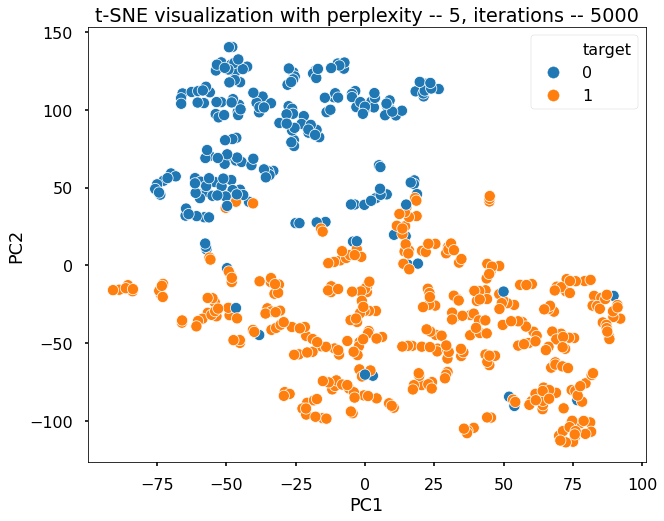

In [70]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(10,8))
    sns.scatterplot(data=cancer_tsne_pcmps,x='PC1',y='PC2',hue='target')
    plt.title("t-SNE visualization with perplexity -- {0}, iterations -- {1}".format(tsne1.perplexity,tsne1.n_iter))

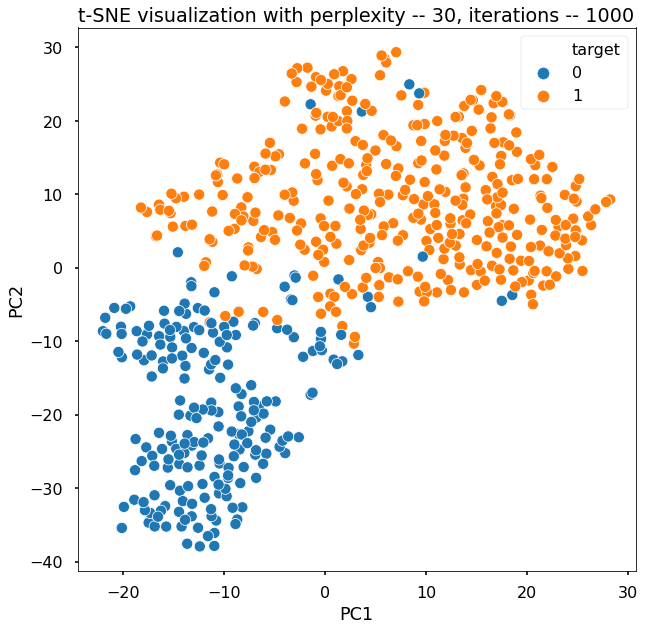

In [65]:
with plt.style.context('seaborn-poster'):
    plt.figure(figsize=(10,10))
    sns.scatterplot(data=cancer_tsne_pcmps,x='PC1',y='PC2',hue='target')
    plt.title("t-SNE visualization with perplexity -- {0}, iterations -- {1}".format(tsne1.perplexity,tsne1.n_iter))